# Projeto Airbnb Rio - Ferramenta de Previsão de Preço de Imóvel para pessoas comuns 

### Importar Bibliotecas e Bases de Dados

In [184]:
import pandas as pd
import numpy as np # biblioteca de tratamento de séries de dados
import seaborn as sns
import matplotlib.pyplot as plt

from pathlib import Path


meses = {"jan": 1, "fev": 2, "mar": 3, "abr": 4, "mai": 5, "jun": 6, "jul": 7, "ago": 8, "set": 9, "out": 10, "nov": 11, "dez": 12}

df_base = pd.DataFrame()

caminho = Path.cwd() / "dataset"

for arquivo in caminho.iterdir():

    nome = arquivo.name
    if nome.endswith(".csv"):
        df_individual = pd.read_csv(caminho / nome)
        df_individual["Mês"] = meses[nome[:3]]
        df_individual["Ano"] = nome[len(nome) - 8:len(nome) - 4]
        df_base = pd.concat([df_base, df_individual], ignore_index=True)

display(df_base)

C:\Users\User\AppData\Local\Temp\ipykernel_2432\3083429637.py:19: DtypeWarning:

Columns (62,87) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\User\AppData\Local\Temp\ipykernel_2432\3083429637.py:19: DtypeWarning:

Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\User\AppData\Local\Temp\ipykernel_2432\3083429637.py:19: DtypeWarning:

Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\User\AppData\Local\Temp\ipykernel_2432\3083429637.py:19: DtypeWarning:

Columns (87) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\User\AppData\Local\Temp\ipykernel_2432\3083429637.py:19: DtypeWarning:

Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\User\AppData\Local\Temp\ipykernel_2432\3083429637.py:19: DtypeWarning:

Columns (87) have mixed types. Specify dtype option o

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
902206,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
902207,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
902208,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


### Consolidar Base de Dados

In [185]:
# eliminar colunas desnecessárias

#df_base.head(1000).to_excel("base para tratamento.xlsx", index=False) -> tirar na mão colunas que não fazem sentido

tratamento = pd.read_excel(r"C:\Users\User\Downloads\base para tratamento (1).xlsx") # trazer de volta para o pandas com as colunas que fazem sentido

#tratamento = tratamento.drop("host_location", axis=1)

for coluna in tratamento:
    print(coluna)
    

host_location
host_is_superhost
host_listings_count
neighbourhood
latitude
longitude
property_type
room_type
accommodates
bathrooms
bedrooms
beds
bed_type
amenities
price
guests_included
extra_people
minimum_nights
maximum_nights
number_of_reviews
instant_bookable
is_business_travel_ready
cancellation_policy
Mês
Ano


In [186]:
# eliminar colunas desnecessárias

# pegar colunas do excel filtrado
filtradas = [coluna for coluna in tratamento]

df_base = df_base[filtradas]
display(df_base)

,host_location,host_is_superhost,host_listings_count,neighbourhood,latitude,longitude,property_type,room_type,accommodates,bathrooms,...,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,is_business_travel_ready,cancellation_policy,Mês,Ano
0,FL,f,1.0,Botafogo,-22.946854,-43.182737,Apartment,Entire home/apt,4,1.0,...,2,$34.00,60,365,38,f,f,strict_14_with_grace_period,4,2018
1,"Rio de Janeiro, Rio de Janeiro, Brazil",t,2.0,Copacabana,-22.965919,-43.178962,Condominium,Entire home/apt,5,1.0,...,2,$51.00,4,90,205,t,f,strict,4,2018
2,"Rio de Janeiro, Rio de Janeiro, Brazil",f,1.0,Ipanema,-22.985698,-43.201935,Apartment,Entire home/apt,2,1.0,...,2,$215.00,3,90,85,f,f,strict,4,2018
3,"Rio de Janeiro, State of Rio de Janeiro, Brazil",f,3.0,Copacabana,-22.977117,-43.190454,Apartment,Entire home/apt,3,1.0,...,2,$45.00,4,30,208,f,f,strict,4,2018
4,"Rio de Janeiro, Rio de Janeiro, Brazil",t,1.0,Ipanema,-22.983024,-43.214270,Apartment,Entire home/apt,3,1.0,...,2,$68.00,2,1125,200,t,f,strict,4,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,"Rio de Janeiro, State of Rio de Janeiro, Brazil",f,0.0,Barra da Tijuca,-23.003180,-43.342840,Apartment,Entire home/apt,4,1.0,...,2,$50.00,1,1125,0,f,f,flexible,9,2019
902206,Brazil,f,0.0,Barra da Tijuca,-22.966640,-43.393450,Apartment,Entire home/apt,4,2.0,...,1,$0.00,2,1125,0,f,f,flexible,9,2019
902207,"Rio de Janeiro, Rio de Janeiro, Brazil",f,32.0,Copacabana,-22.962080,-43.175520,Apartment,Entire home/apt,5,1.0,...,3,$30.00,3,1125,0,f,f,strict_14_with_grace_period,9,2019
902208,"Rio de Janeiro, Rio de Janeiro, Brazil",f,0.0,Barra da Tijuca,-23.003400,-43.341820,Apartment,Entire home/apt,4,1.0,...,1,$0.00,1,1125,0,f,f,strict_14_with_grace_period,9,2019


### Tratar Valores Faltando

In [187]:
# ver quantos NAN tem em cada coluna
print(df_base.isnull().sum())


# duas opções: excluir todas as linhas que têm algum NAN para manter todas as variáveis ou cortar colunas fora / pode-se ainda preencher as colunas vazias

# optou-se no exemplo por retirar todas as colunas com valores acima de 300k em branco
for coluna in df_base:
    if df_base[coluna].isnull().sum() > 300000:
        df_base = df_base.drop(coluna, axis=1)
        

print(df_base.isnull().sum())

# como as outras colunas apresentam menos valores em branco, considerando um total de 900k linhas na df, optou-se por excluir as linhas que possuem algum valor NAN
df_base = df_base.dropna()

# ver quantas linhas e colunas
print(df_base.shape)

# tirar cidade, já que é no rio de janeiro msm
#df_base = df_base.drop(["street", "city"], axis=1)

host_location                4975
host_is_superhost             460
host_listings_count           460
neighbourhood               58077
latitude                        0
longitude                       0
property_type                   0
room_type                       0
accommodates                    0
bathrooms                    1724
bedrooms                      850
beds                         2502
bed_type                        0
amenities                       0
price                           0
guests_included                 0
extra_people                    0
minimum_nights                  0
maximum_nights                  0
number_of_reviews               0
instant_bookable                0
is_business_travel_ready        0
cancellation_policy             0
Mês                             0
Ano                             0
dtype: int64
host_location                4975
host_is_superhost             460
host_listings_count           460
neighbourhood               58077
l

### Verificar Tipos de Dados em cada coluna

In [188]:
# ver tipo de dados de cada coluna
print(df_base.dtypes)

print("-" * 60)

# ver primeira linha da tabela para saber se o tipo de dado está condizente
print(df_base.iloc[0])



host_location                object
host_is_superhost            object
host_listings_count         float64
neighbourhood                object
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
Mês                           int64
Ano                          object
dtype: object
------------------------------------------------------------
host_location            

In [189]:
# preço tem que mudar (float32 ocupa menos espaço)
df_base["price"] = df_base["price"].str.replace(r"$", "").str.replace(",", "") # tirar "$" e "," da string
df_base["price"] = df_base["price"].astype(np.float32, copy=False) # trocar tipo de dado da coluna

# extra people tem que mudar
df_base["extra_people"] = df_base["extra_people"].str.replace(r"$", "").str.replace(",", "") # tirar "$" e "," da string
df_base["extra_people"] = df_base["extra_people"].astype(np.float32, copy=False) # trocar tipo de dado da coluna

# ano tem que mudar
df_base["Ano"] = df_base["Ano"].astype(np.int32, copy=False)

print(df_base.dtypes)

C:\Users\User\AppData\Local\Temp\ipykernel_2432\2758580544.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.

C:\Users\User\AppData\Local\Temp\ipykernel_2432\2758580544.py:6: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



host_location                object
host_is_superhost            object
host_listings_count         float64
neighbourhood                object
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                       float32
guests_included               int64
extra_people                float32
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
Mês                           int64
Ano                           int32
dtype: object


### Análise Exploratória e Tratar Outliers

- Vamos basicamente olhar feature por feature para:
    1. Ver a correlação entre as features e decidir se manteremos todas as features que temos.
    2. Excluir outliers (usaremos como regra, valores abaixo de Q1 - 1.5xAmplitude e valores acima de Q3 + 1.5x Amplitude). Amplitude = Q3 - Q1
    3. Confirmar se todas as features que temos fazem realmente sentido para o nosso modelo ou se alguma delas não vai nos ajudar e se devemos excluir (se colunas apresentarem correlações de quase 100% entre si, as informações tendem a ser as mesmas, podendo-se excluir uma delas para não enviesar o modelo)
    
- Vamos começar pelas colunas de preço (resultado final que queremos) e de extra_people (também valor monetário). Esses são os valores numéricos contínuos.

- Depois vamos analisar as colunas de valores numéricos discretos (accomodates, bedrooms, guests_included, etc.)

- Por fim, vamos avaliar as colunas de texto e definir quais categorias fazem sentido mantermos ou não.

MAS CUIDADO: não saia excluindo direto outliers, pense exatamente no que você está fazendo. Se não tem um motivo claro para remover o outlier, talvez não seja necessário e pode ser prejudicial para a generalização. Então tem que ter uma balança ai. Claro que você sempre pode testar e ver qual dá o melhor resultado, mas fazer isso para todas as features vai dar muito trabalho.

Ex de análise: Se o objetivo é ajudar a precificar um imóvel que você está querendo disponibilizar, excluir outliers em host_listings_count pode fazer sentido. Agora, se você é uma empresa com uma série de propriedades e quer comparar com outras empresas do tipo também e se posicionar dessa forma, talvez excluir quem tem acima de 6 propriedades tire isso do seu modelo. Pense sempre no seu objetivo

C:\Users\User\AppData\Local\Temp\ipykernel_2432\1181005195.py:7: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



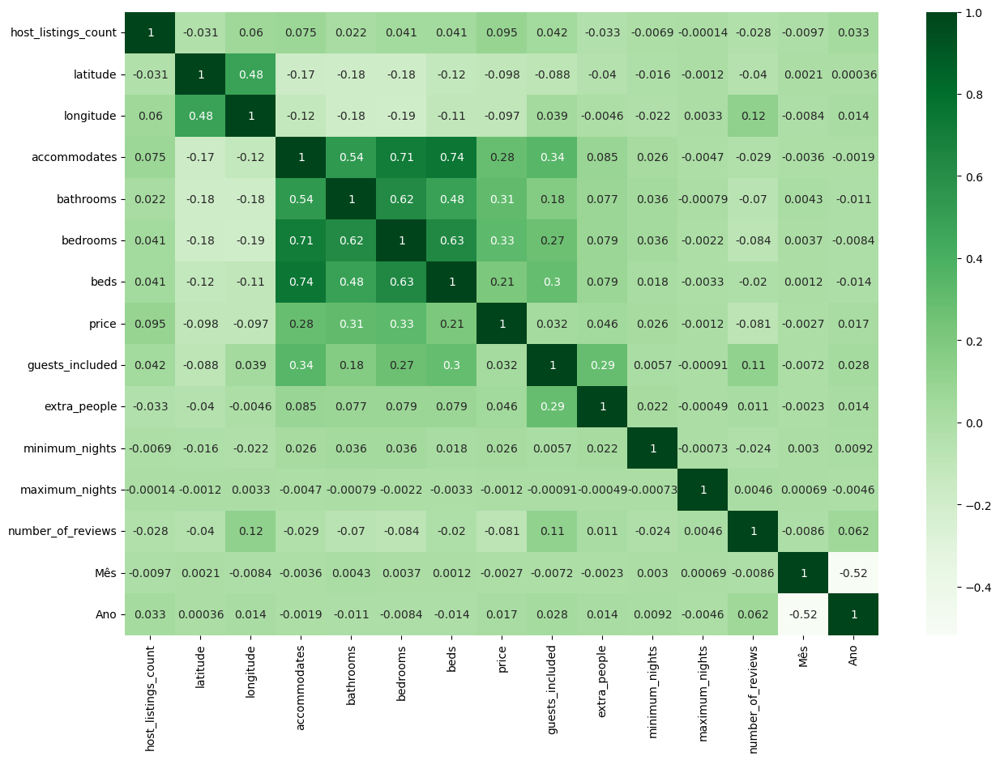

In [190]:
import seaborn as sns
import matplotlib.pyplot as plt


# encontrar correlações entre colunas
plt.figure(figsize=(15, 10))
sns.heatmap(df_base.corr(), annot=True, cmap="Greens") # annot é para dar a descrição do gráfico e cmap é para mudar a cor
plt.show()

In [191]:
# encontrar outliers de cada coluna e retirar as linhas que são classificadas como outliers feita análise qualitativa dessa info


# função que retorna limite inferior e limite superior da coluna
def limites(coluna):
    
    # pegar primeiro e terceiro quartil
    q1 = coluna.quantile(.25)
    q3 = coluna.quantile(.75)
    
    # calcular amplitude
    amplitude = q3 - q1
    
    # retornar limite inferior e limite superior da coluna
    return q1 - 1.5 * amplitude, q3 + 1.5 * amplitude


def excluir_outliers(df, nome_coluna):
    
    # pegar numero de linhas total
    qtd_linhas = len(df.index)
    
    # pegar limite inferior e limite superior
    lim_inf, lim_sup = limites(df[nome_coluna])
    
    # filtrar df
    df = df.loc[(df[nome_coluna] >= lim_inf) & (df[nome_coluna] <= lim_sup), :]
    
    # pegar qtd de linhas removidas
    removidas = qtd_linhas - len(df.index)
    
    return df, removidas


# função que cria gráficos acerca de cada coluna
def diagrama_caixa(coluna):
    
    # botar dois gráficos em uma linha
    fig, (ax1, ax2) = plt.subplots(1, 2)
    
    # mudar tamanho dos gráficos (outra forma de mudar tamanho)
    fig.set_size_inches(15, 5)
    
    # gráfico 1: estabelecer coluna como eixo x e montar primeiro diagram de caixa
    sns.boxplot(x=coluna, ax=ax1)
    
    # gráfico 2: estabelecer limites para o x
    ax2.set_xlim(limites(coluna))
    
    # gráfico 2: estabelecer coluna como eixo x e montar segundo diagrama de caixa
    sns.boxplot(x=coluna, ax=ax2)
        
    # exibir gráficos
    plt.show()
    

# função para criar histograma
def histograma(coluna):
    
    # definir tamanho
    plt.figure(figsize=(15, 5))
    
    # plotar coluna em um histograma
    sns.histplot(coluna, kde=True)
    
    # exibir gráfico
    plt.show()
    
    
def grafico_barra(coluna):
    
    # definir tamanho
    plt.figure(figsize=(15, 5))
    
    # plotar gráfico de barras
    ax = sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts())
    
    # estabelecer limites para x
    ax.set_xlim(limites(coluna))

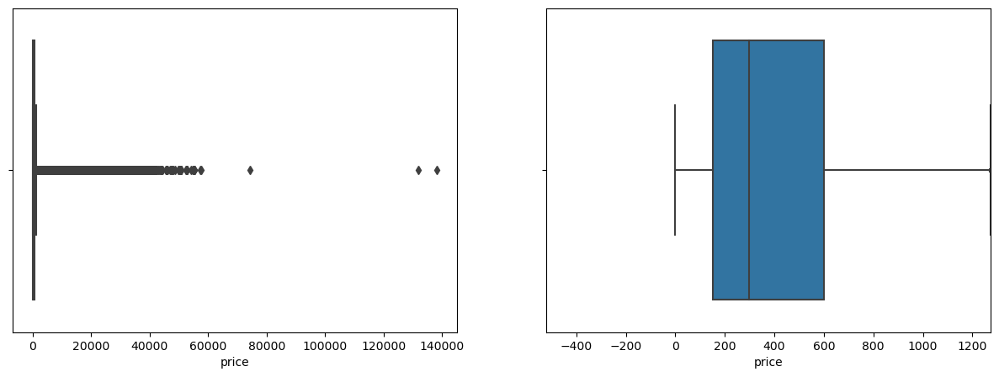

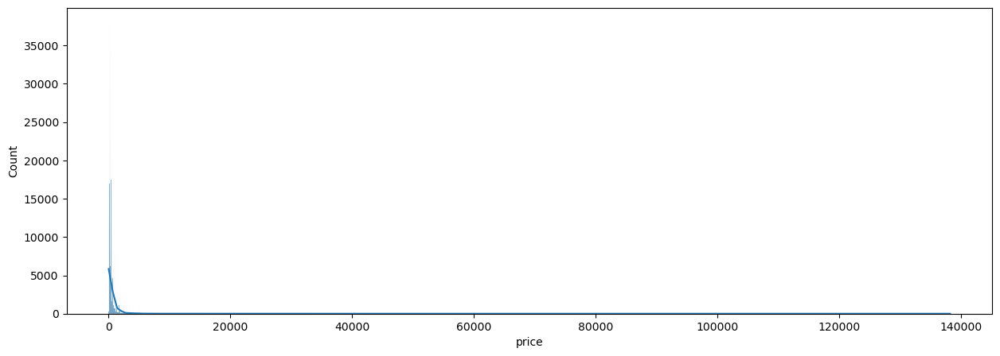

In [192]:
diagrama_caixa(df_base["price"])
histograma(df_base["price"])

In [193]:
# coluna de preço (valor contínuo)

''' 
como a ideia é criar um modelo representativo de imóveis comuns, optou-se por excluir os outliers muito superiores,
porém, deve-se analisar o número de linhas desses outliers, se forem muitas, talvez não seja uma boa ideia
'''

df_base, num_linhas = excluir_outliers(df_base, "price") 

print(f"{num_linhas} linhas excluídas") # praticamente 10% da base de dados, mas o ideal com IA's é sempre ser bem específico para otimizar a acurácia do modelo (novamente, vamos focar em imóveis comuns, podendo ser descartados imóveis de luxo nesse exemplo)

81541 linhas excluídas


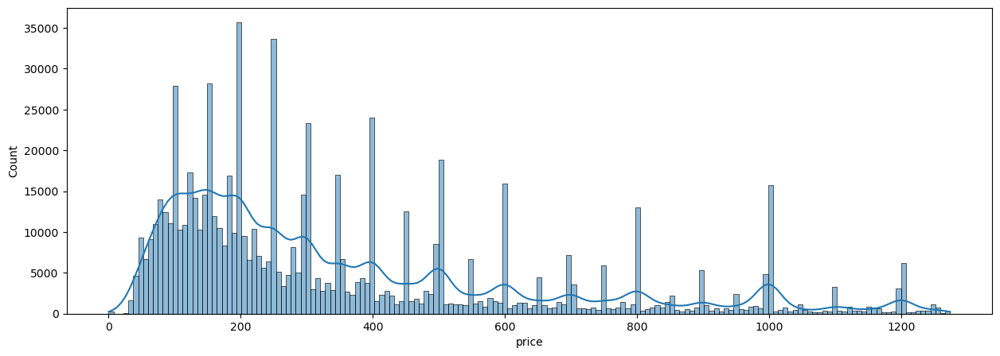

In [194]:
'''pode-se observar que como os preços dos imóveis são estabelecidos por pessoas, há uma tendência de picos locais nos valores inteiros,
como se pode observar no gráfico abaixo
'''

histograma(df_base["price"])

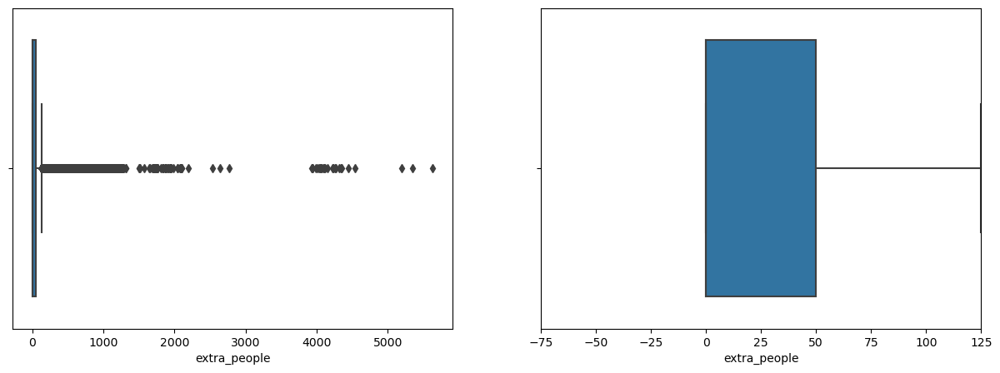

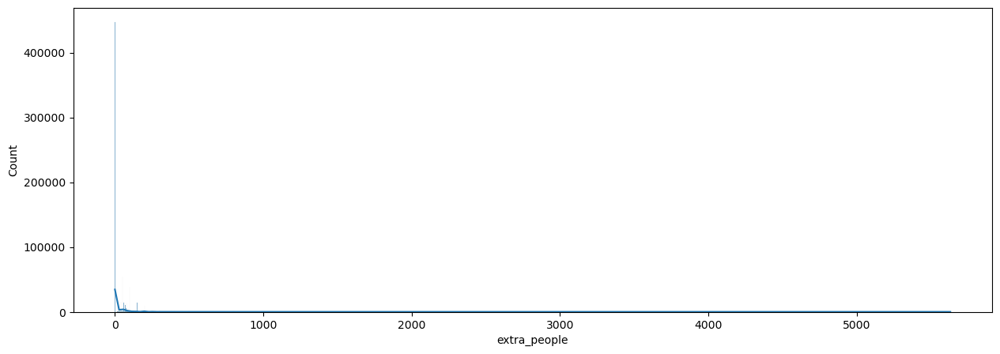

In [195]:
# coluna de extra_people (valor contínuo)
'''análise parecida com a de preço'''

diagrama_caixa(df_base["extra_people"])
histograma(df_base["extra_people"])

In [196]:
# excluindo outliers extra_people (valor contínuo)

df_base, num_linhas = excluir_outliers(df_base, "extra_people") 

print(f"{num_linhas} linhas excluídas")

55419 linhas excluídas


In [ ]:
'''vamos agora partir para a análise de valores discretos
como são valores discretos (inteiros), vamos usar gráficos de barra ao invés de histogramas para facilitar a visualização
'''

host_listings_count         float64
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
guests_included               int64
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64

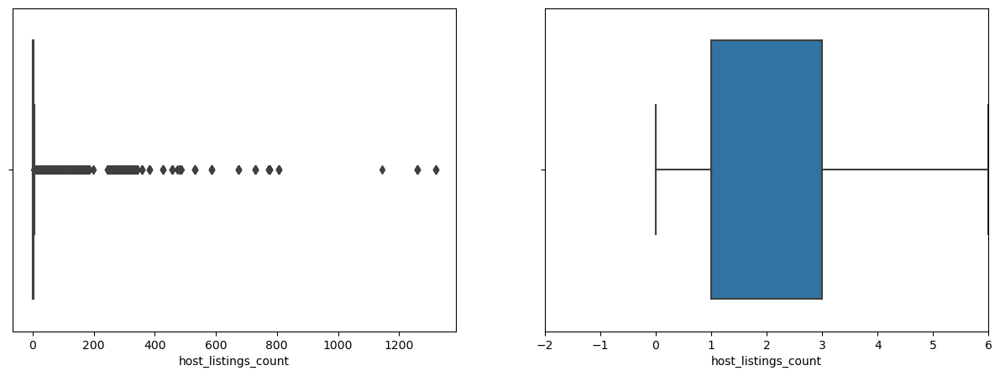

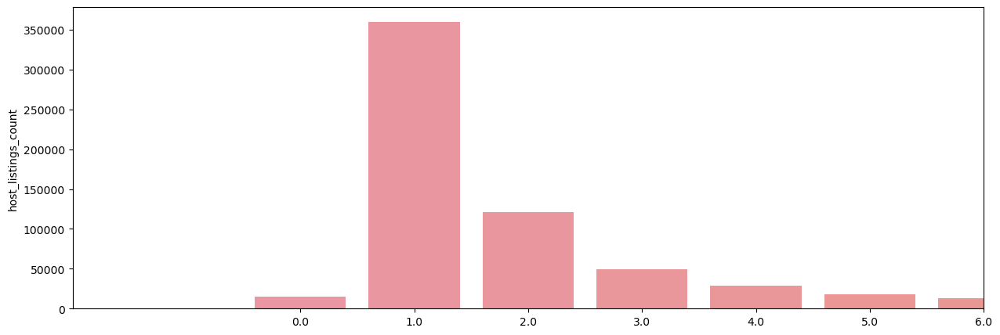

In [197]:
# host_listings_count

diagrama_caixa(df_base["host_listings_count"])
grafico_barra(df_base["host_listings_count"])

In [198]:
'''novamente, como o foco é a precificação de imóveis comuns por pessoas comuns, parece razoável que o limite de
imóveis seja 6, considerando o público a quem o modelo se refere, logo, opta-se pela exclusão dos outliers
'''
# excluindo outliers host_listings_count (valor discreto)

df_base, num_linhas = excluir_outliers(df_base, "host_listings_count") 

print(f"{num_linhas} linhas excluídas")


94066 linhas excluídas


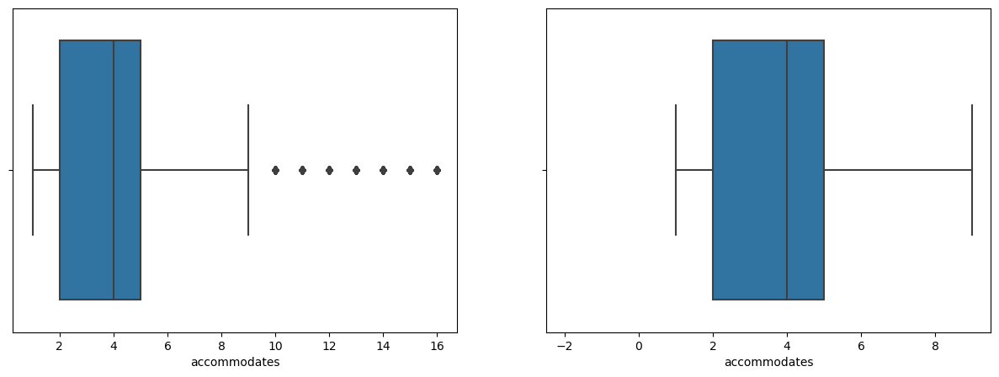

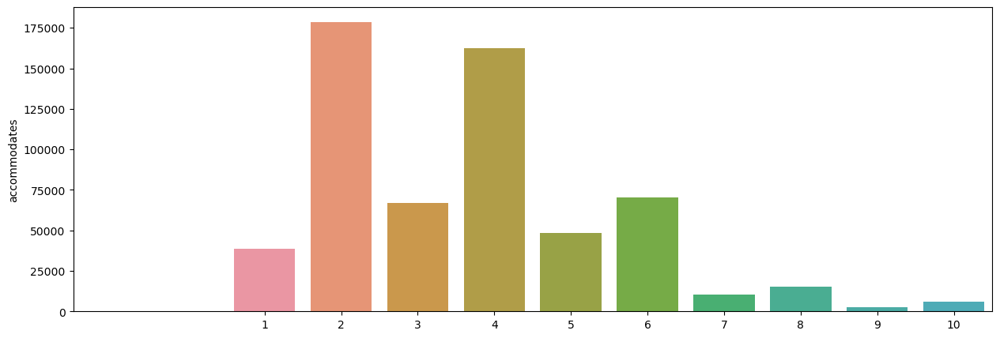

In [199]:
# coluna de accommodates

diagrama_caixa(df_base["accommodates"])
grafico_barra(df_base["accommodates"])

In [200]:
'''opta-se por excluir novamente considerando o público-alvo do modelo e o padrão que vem sendo seguido até aqui'''

# excluindo outliers accommodates (valor discreto)

df_base, num_linhas = excluir_outliers(df_base, "accommodates") 

print(f"{num_linhas} linhas excluídas")

10761 linhas excluídas


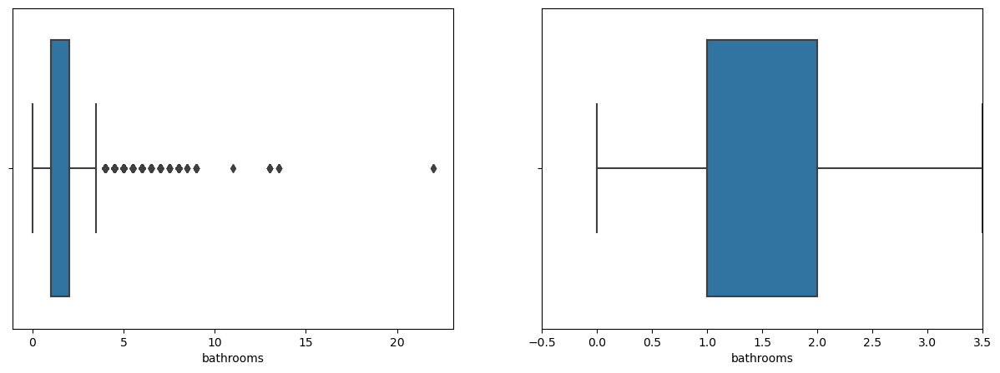

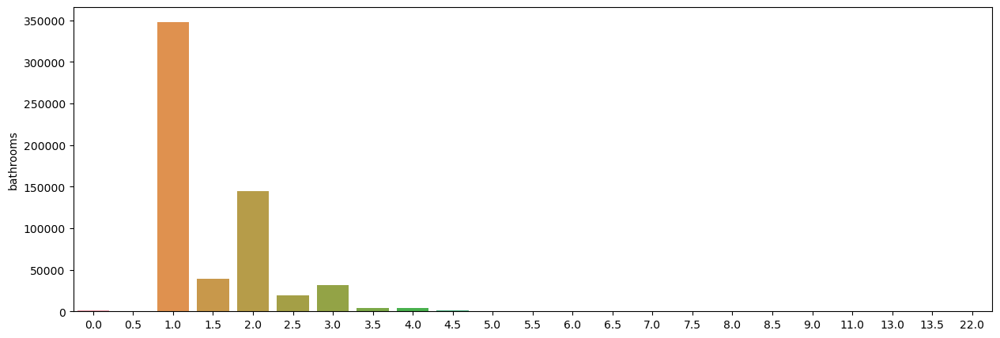

In [201]:
# coluna bathrooms

diagrama_caixa(df_base["bathrooms"])

# por algum motivo, os limites do gráfico de barras não estão sendo bem exibidos, então vamos eliminar os limites para esse caso específico
plt.figure(figsize=(15, 5))
sns.barplot(x=df_base["bathrooms"].value_counts().index, y=df_base["bathrooms"].value_counts())
plt.show()

In [202]:
'''como os dados aparentam ser bem poucos mesmo acima de 3.5 (limite superior), opta-se por remover os outliers'''

# excluindo outliers bathrooms (valor discreto)

df_base, num_linhas = excluir_outliers(df_base, "bathrooms") 

print(f"{num_linhas} linhas excluídas")

6160 linhas excluídas


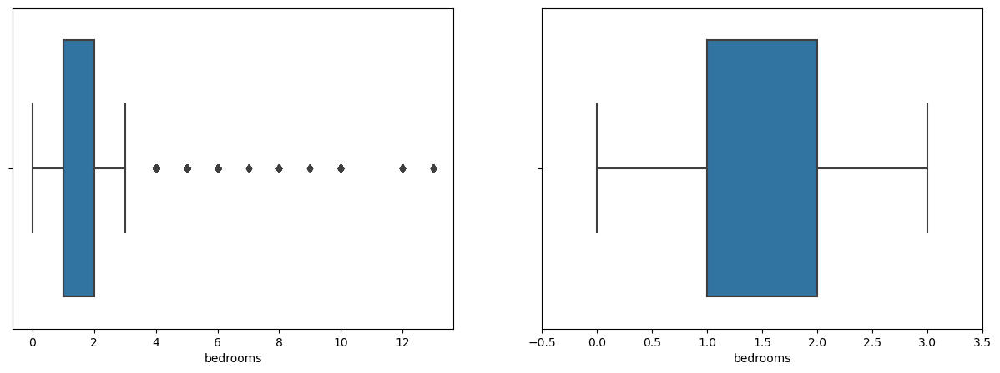

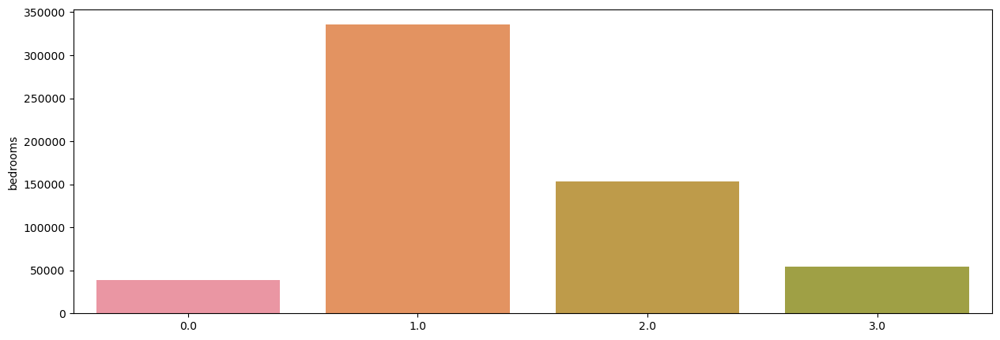

In [203]:
# coluna bedrooms (discreta)

diagrama_caixa(df_base["bedrooms"])
grafico_barra(df_base["bedrooms"])

In [204]:
'''optou-se por remover os outliers'''

# excluindo outliers bedrooms (valor discreto)

df_base, num_linhas = excluir_outliers(df_base, "bedrooms") 

print(f"{num_linhas} linhas excluídas")

5081 linhas excluídas


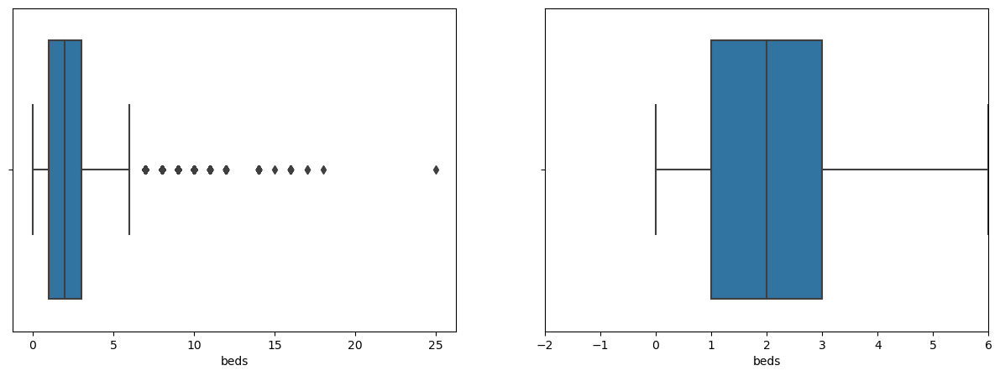

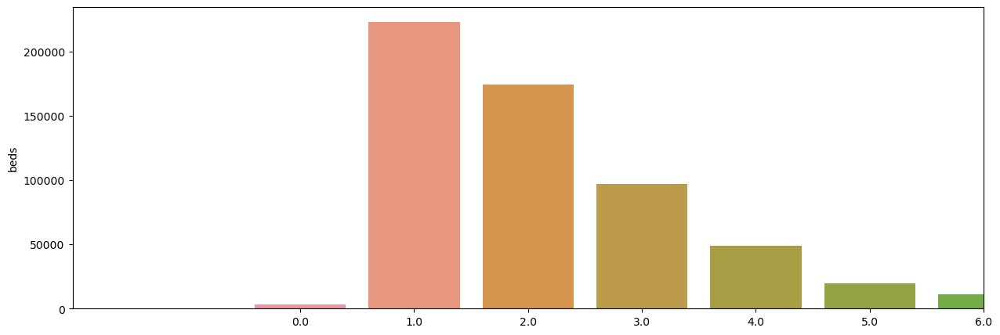

In [205]:
# coluna beds (discreta)

diagrama_caixa(df_base["beds"])
grafico_barra(df_base["beds"])

In [206]:
'''optou-se por excluir os outliers, considerando que 6 camas ou menos é um valor razoável para o modelo'''

# excluindo outliers beds (valor discreto)

df_base, num_linhas = excluir_outliers(df_base, "beds") 

print(f"{num_linhas} linhas excluídas")

5220 linhas excluídas


C:\Users\User\AppData\Local\Temp\ipykernel_2432\119377864.py:48: UserWarning:

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.



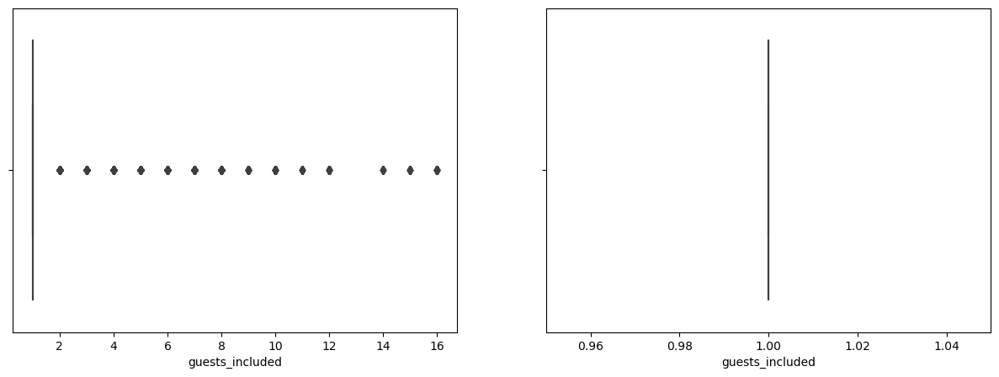

C:\Users\User\AppData\Local\Temp\ipykernel_2432\119377864.py:79: UserWarning:

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.



(1.0, 1.0)


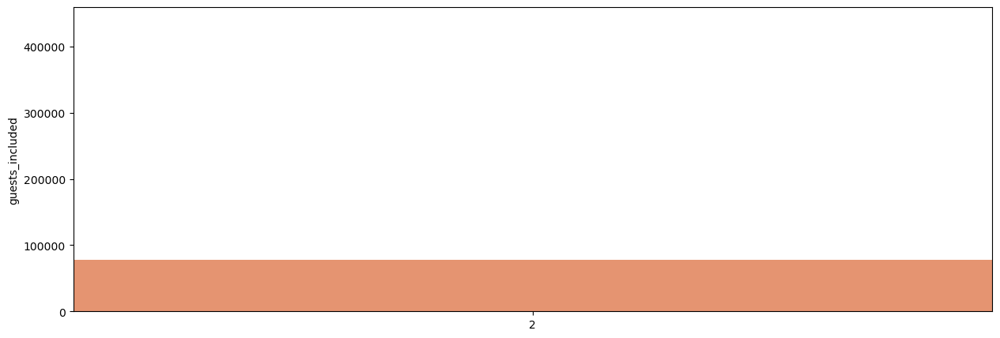

In [207]:
# coluna guests_included (discreto)
'''os limites ficaram como (1, 1), o que poderia fazer o modelo entender que essa variável não é importante
optando-se por excluí-la, como nesse caso, não houve o mesmo evento, penso em deixá-la, mas tirando os outliers
'''

diagrama_caixa(df_base["guests_included"])
grafico_barra(df_base["guests_included"])
print(limites(df_base["guests_included"]))

In [208]:
'''
opta-se pela exclusão da coluna
'''
# excluindo outliers guests_included (valor discreto)

df_base = df_base.drop("guests_included", axis=1)


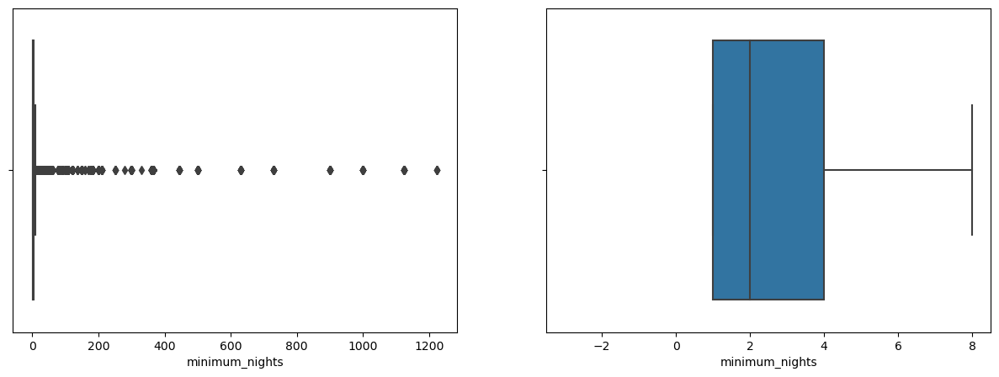

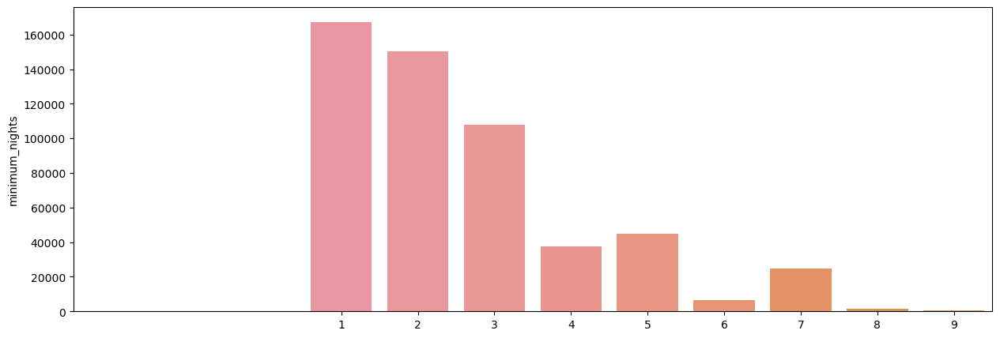

In [209]:
# coluna minimum_nights (discreto)

diagrama_caixa(df_base["minimum_nights"])
grafico_barra(df_base["minimum_nights"])

In [210]:
'''como a ideia é disponibilizar um imóvel comum, sem ser durante a temporada, 8 noites parece bem razoável
opta-se pela exclusão dos outliers
'''
# excluindo outliers mimimum_nights (valor discreto)

df_base, num_linhas = excluir_outliers(df_base, "minimum_nights") 

print(f"{num_linhas} linhas excluídas")


36980 linhas excluídas


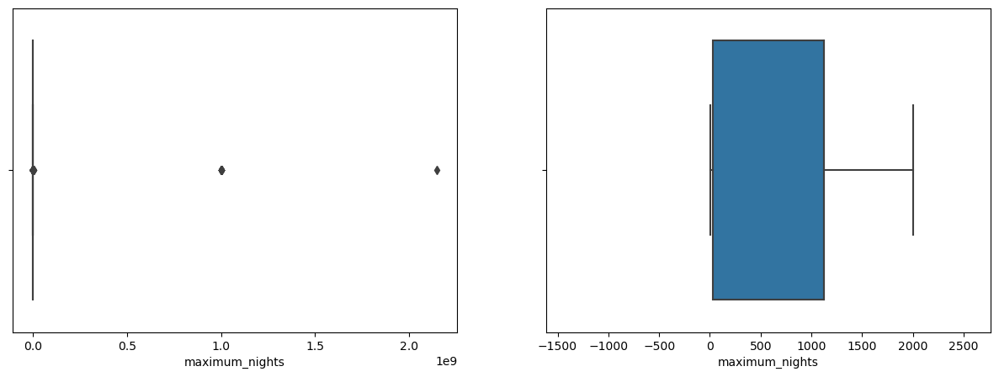

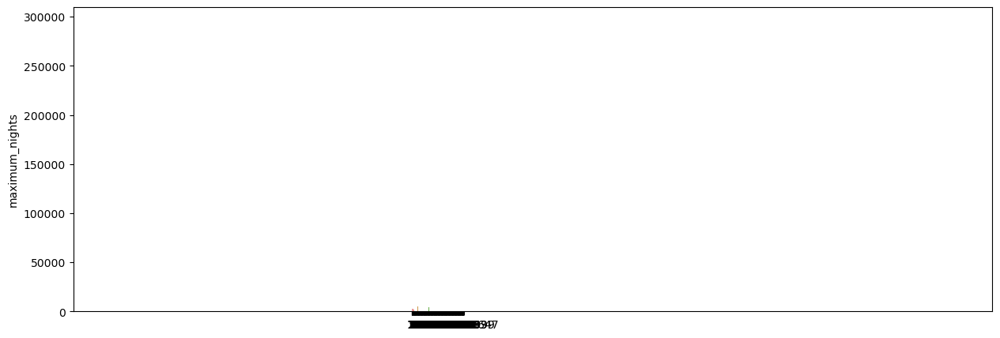

In [211]:
# coluna maximum_nights (discreto)

diagrama_caixa(df_base["maximum_nights"])
grafico_barra(df_base["maximum_nights"])

In [212]:
'''a partir da análise feita, a métrica maximum_nights não será útil, considerando que a maiorias das pessoas
provavelmente nem preencheu esse campo no airbnb, e pelo que tudo indica, aparentemente esse não é um critério definidor de preço
opta-se por remover a coluna
'''
# remoção da coluna maximum_nights
df_base = df_base.drop("maximum_nights", axis=1)


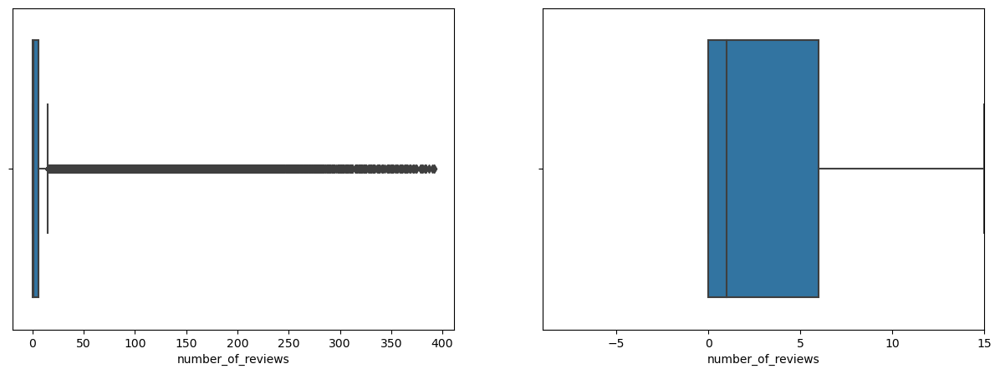

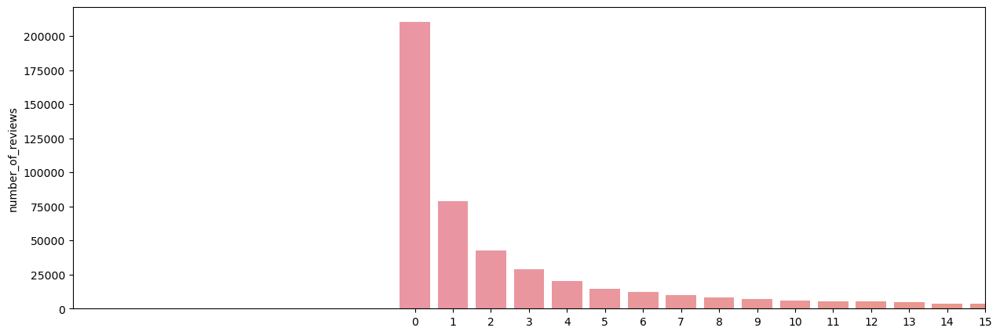

In [213]:
# coluna number_of_reviews (discreto)

diagrama_caixa(df_base["number_of_reviews"])
grafico_barra(df_base["number_of_reviews"])

In [ ]:
'''eliminar outlier de reviews seria eliminar os melhores hosts/ que estão há mais tempo na plataforma, algo que provavelmente
não seria a melhor das ideias. opta-se por manter a coluna e os outliers

se o objetivo fosse precificar um imóvel do zero, sem nenhuma review, poderia-se eliminar a coluna

quanto mais simples o modelo, melhor -> mais utilizável e rápido de rodar, sempre tentar manter apenas as variáveis mais impactantes
'''

In [ ]:
# análise exploratória de variáveis de texto

host_location                object
neighbourhood                object
property_type                object
room_type                    object
bed_type                     object
cancellation_policy          object

Apartment                 436104
House                      38800
Condominium                23949
Serviced apartment         12060
Loft                       11722
Guest suite                 3239
Bed and breakfast           3191
Hostel                      2531
Guesthouse                  1810
Other                       1633
Villa                       1142
Townhouse                    816
Aparthotel                   633
Boutique hotel               440
Chalet                       409
Tiny house                   364
Hotel                        350
Earth house                  306
Casa particular (Cuba)       231
Bungalow                     178
Dorm                         154
Cottage                      126
Nature lodge                 103
Cabin                         74
Castle                        66
Island                        54
Treehouse                     51
Boat                          48
Campsite                      34
Resort                        26
Camper/RV 

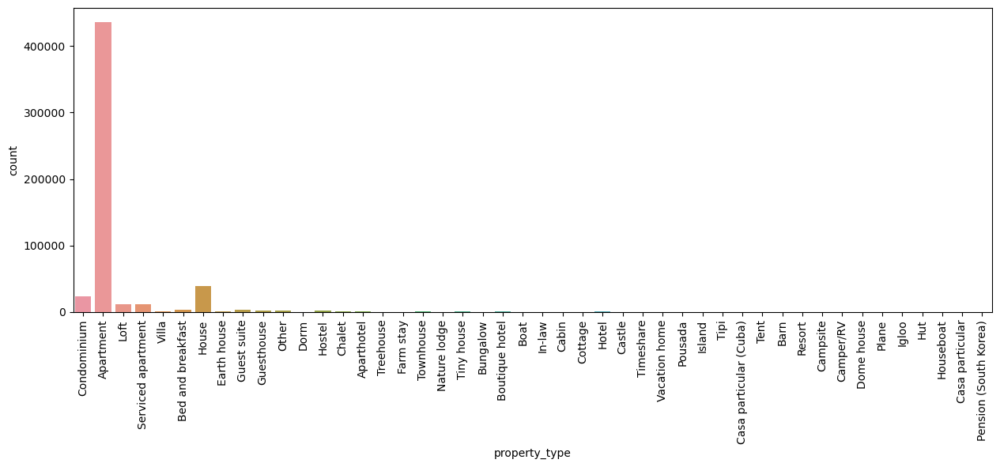

In [214]:
# coluna property_type

print(df_base["property_type"].value_counts()) # observar propriedades que talvez não faça sentido analisar como categoria separada

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["property_type"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

Apartment             436104
House                  38800
Condominium            23949
Serviced apartment     12060
Loft                   11722
Other                   7370
Guest suite             3239
Bed and breakfast       3191
Hostel                  2531
Guesthouse              1810
Name: property_type, dtype: int64


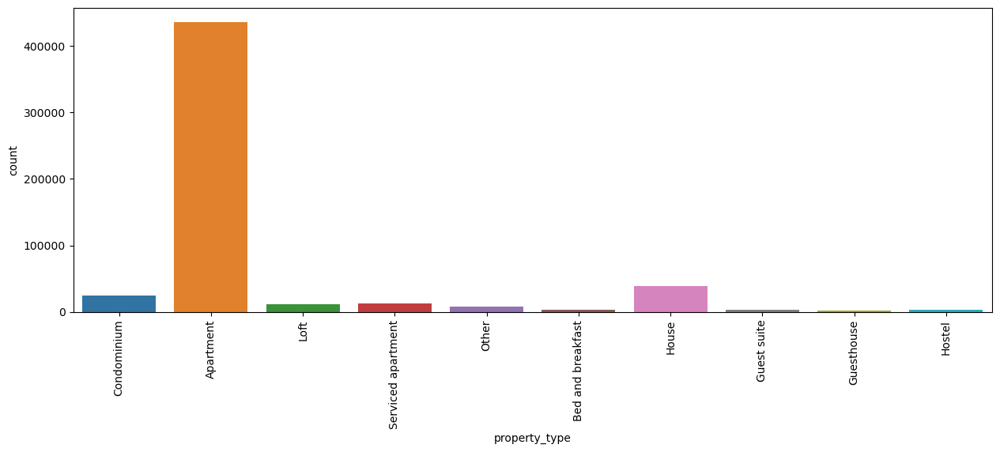

In [215]:
'''por opção, decidiu-se tratar tudo abaixo de outros como uma categoria única,
considerando que não são categorias tão representativas

PAROU AQUI -> ver no vídeo como property_type é tratado
'''
tabelas_tipo_casa = df_base["property_type"].value_counts()

colunas_agrupar = []

# pegar colunas para agrupar
for tipo in tabelas_tipo_casa.index:
    if tabelas_tipo_casa[tipo] < 1700:
        colunas_agrupar.append(tipo)
        
# alterar valores para "outros"
for tipo in colunas_agrupar:
    df_base.loc[df_base["property_type"] == tipo, "property_type"] = "Other"


print(df_base["property_type"].value_counts())

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["property_type"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

Entire home/apt    350927
Private room       178801
Shared room         10101
Hotel room            947
Name: room_type, dtype: int64


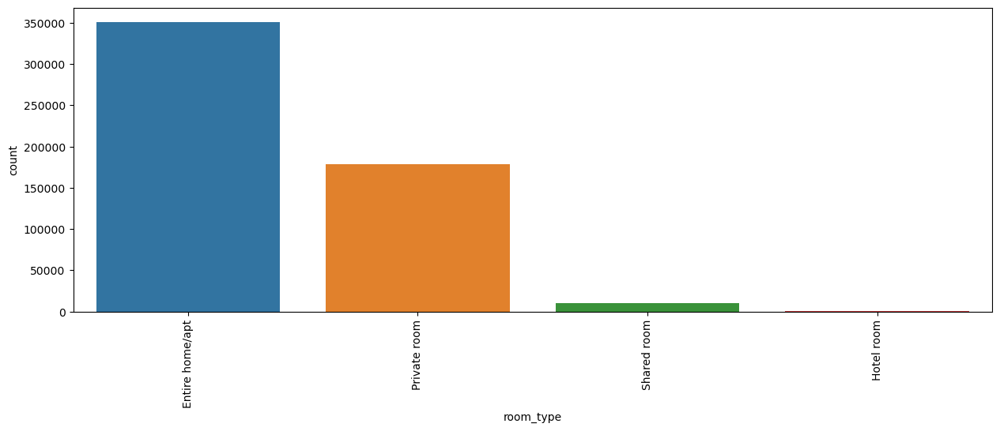

In [216]:
# coluna room_type

print(df_base["room_type"].value_counts()) # observar propriedades que talvez não faça sentido analisar como categoria separada

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["room_type"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

In [ ]:
'''apenas quatro categorias já aparentam estar de bom tamanho. já está bem simplificado
opta-se por não mexer
'''

Real Bed         530338
Pull-out Sofa      7447
Futon              1489
Airbed             1033
Couch               469
Name: bed_type, dtype: int64


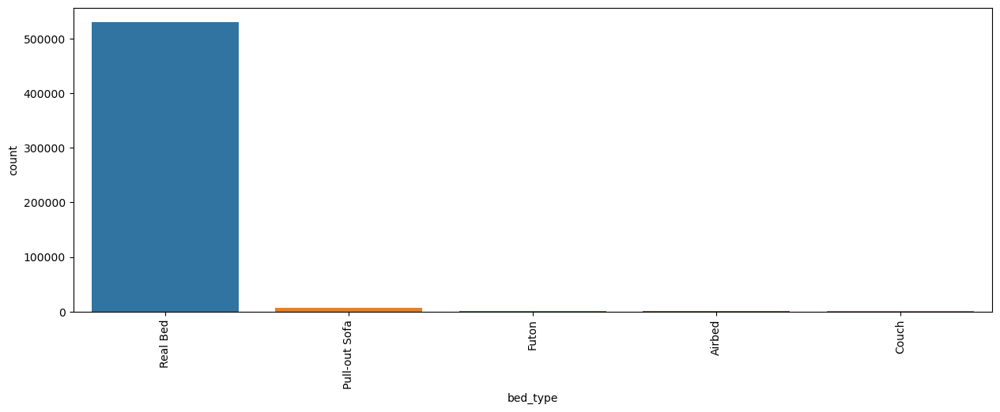

In [217]:
# coluna bed_type

print(df_base["bed_type"].value_counts()) # observar propriedades que talvez não faça sentido analisar como categoria separada

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["bed_type"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

Real Bed    530338
Other        10438
Name: bed_type, dtype: int64


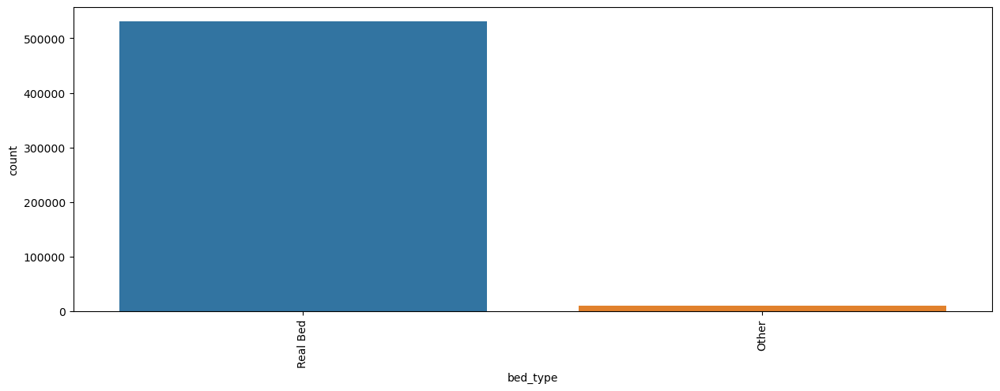

In [218]:
'''por não ser uma qtd muito grande de categorias, apesar da discrepância entre o primeiro e os demais,
parece coerente o suficiente mantê-los, já que não existem 5 valores grandes e o resto fragmentado, ou então 20 valores fragmentados
porém, visando simplificar o modelo, opta-se por agrupar todos os que não são "Real Bed"
'''

tabelas_tipo_cama = df_base["bed_type"].value_counts()

colunas_agrupar = []


# pegar colunas para agrupar
for tipo in tabelas_tipo_cama.index:
    if tabelas_tipo_cama[tipo] < 8000:
        colunas_agrupar.append(tipo)
        
# alterar valores para "strict"
for tipo in colunas_agrupar:
    df_base.loc[df_base["bed_type"] == tipo, "bed_type"] = "Other"


print(df_base["bed_type"].value_counts())

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["bed_type"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()


flexible                       233152
strict_14_with_grace_period    191073
moderate                       107022
strict                           9362
super_strict_60                   135
super_strict_30                    32
Name: cancellation_policy, dtype: int64


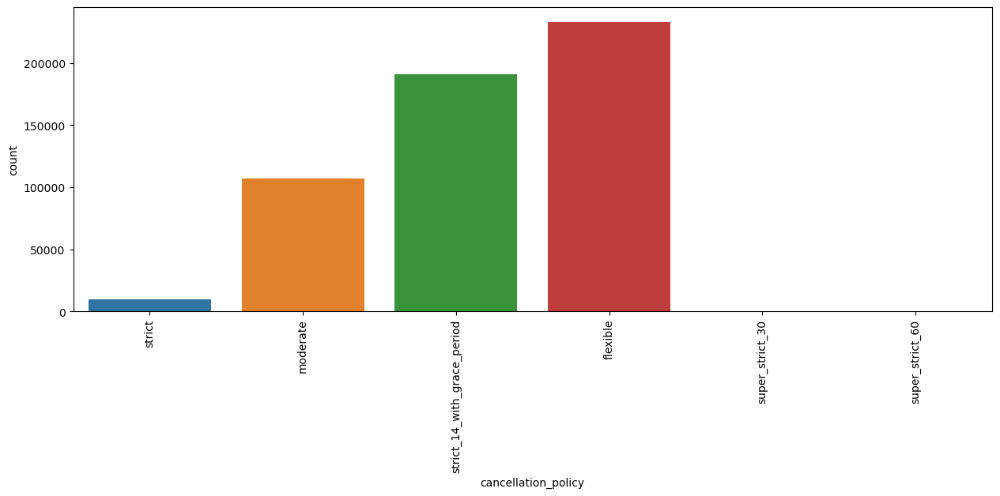

In [219]:
# coluna cancelation_policy

print(df_base["cancellation_policy"].value_counts()) # observar propriedades que talvez não faça sentido analisar como categoria separada

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["cancellation_policy"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

flexible                       233152
strict_14_with_grace_period    191073
moderate                       107022
strict                           9529
Name: cancellation_policy, dtype: int64


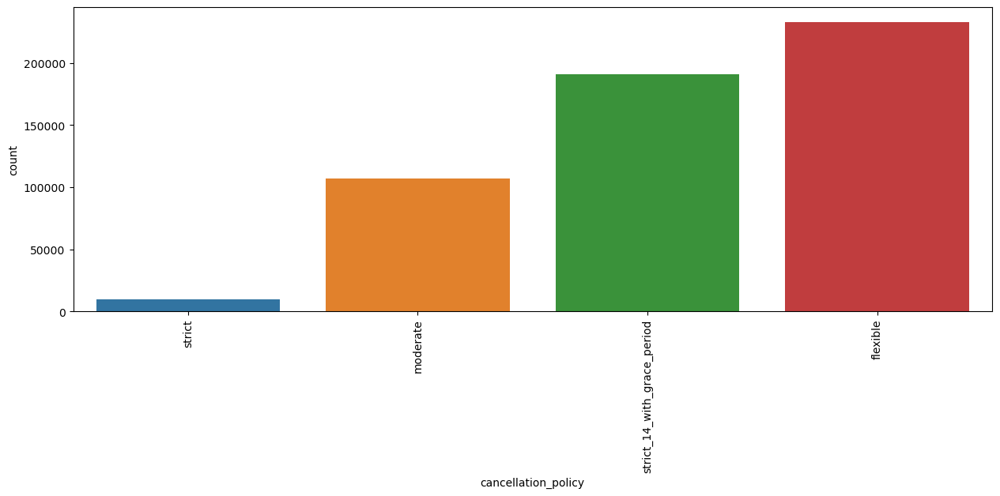

In [220]:
'''como as duas últimas categorias são ínfimas comparadas às demais, e por também serem similares à coluna strict,
opta-se por agrupar essas 3 em uma só
'''

tabelas_cancellation = df_base["cancellation_policy"].value_counts()

colunas_agrupar = []

# pegar colunas para agrupar
for tipo in tabelas_cancellation.index:
    if tabelas_cancellation[tipo] < 11000:
        colunas_agrupar.append(tipo)
        
# alterar valores para "strict"
for tipo in colunas_agrupar:
    df_base.loc[df_base["cancellation_policy"] == tipo, "cancellation_policy"] = "strict"
    
print(df_base["cancellation_policy"].value_counts())

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["cancellation_policy"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

Rio de Janeiro, State of Rio de Janeiro, Brazil    262318
BR                                                  80754
Rio de Janeiro, Rio de Janeiro, Brazil              53646
Rio, Rio de Janeiro, Brazil                         46829
Brazil                                               5963
                                                    ...  
Cachoeiras, Rio de Janeiro, Brazil                      1
Olaria, State of Rio de Janeiro, Brazil                 1
The Hague, South Holland, The Netherlands               1
Banfield, Buenos Aires Province, Argentina              1
Rio Imbariê, Rio de Janeiro, Brazil                     1
Name: host_location, Length: 1505, dtype: int64


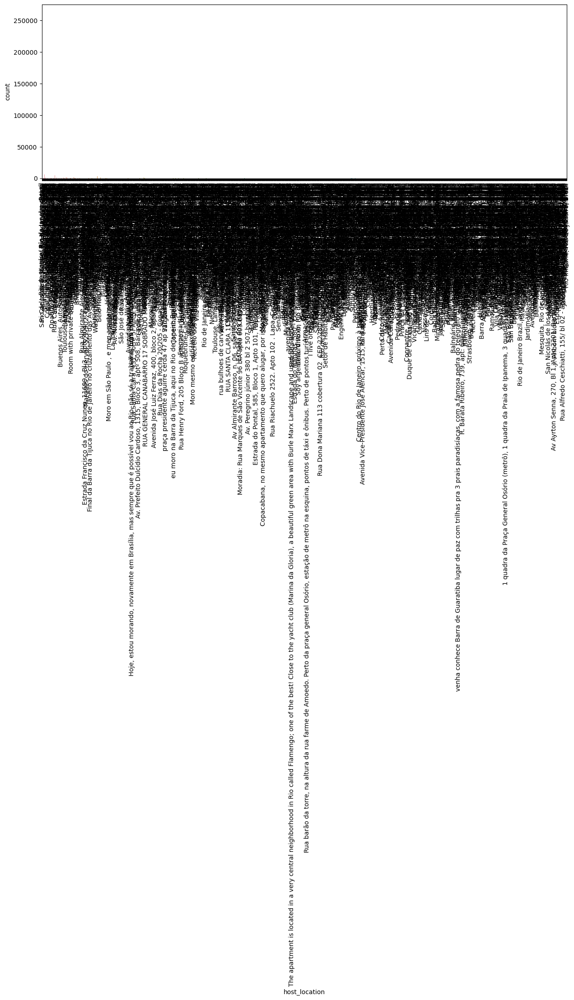

In [221]:
# coluna host_location (já tinha eliminado essa coluna)

print(df_base["host_location"].value_counts()) # observar propriedades que talvez não faça sentido analisar como categoria separada

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["host_location"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

In [222]:
'''a maioria dos locais é o próprio RJ, porém escrito de formas diferentes. Nesse sentido, não faz sentido manter a coluna
opta-se por descartar toda a coluna
'''

df_base = df_base.drop("host_location", axis=1)

Copacabana                  142074
Barra da Tijuca              83884
Ipanema                      39821
Botafogo                     32802
Recreio dos Bandeirantes     28631
                             ...  
Complexo da Maré                10
Parque Colúmbia                 10
Jardim América                   7
Engenheiro Leal                  5
Turiaçu                          1
Name: neighbourhood, Length: 103, dtype: int64


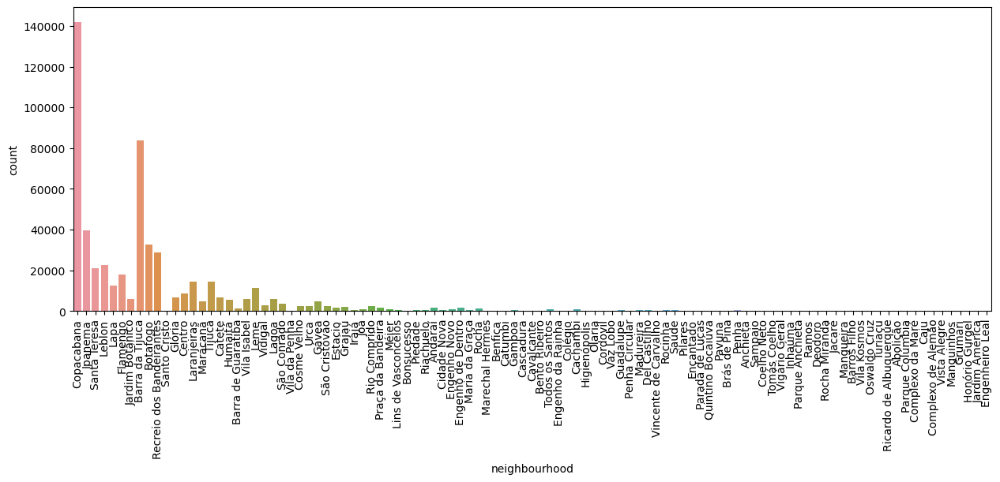

In [223]:
# coluna neighbourhood

print(df_base["neighbourhood"].value_counts()) # observar propriedades que talvez não faça sentido analisar como categoria separada

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["neighbourhood"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

Copacabana                  132328
Barra da Tijuca              77320
Other                        52779
Ipanema                      36726
Botafogo                     32085
Recreio dos Bandeirantes     26802
Santa Teresa                 20843
Leblon                       20689
Flamengo                     17240
Tijuca                       14555
Laranjeiras                  13799
Lapa                         12568
Leme                         10361
Centro                        8643
Catete                        6564
Glória                        6225
Vila Isabel                   6005
Jardim Botânico               5816
Lagoa                         5508
Humaitá                       5283
Name: neighbourhood, dtype: int64


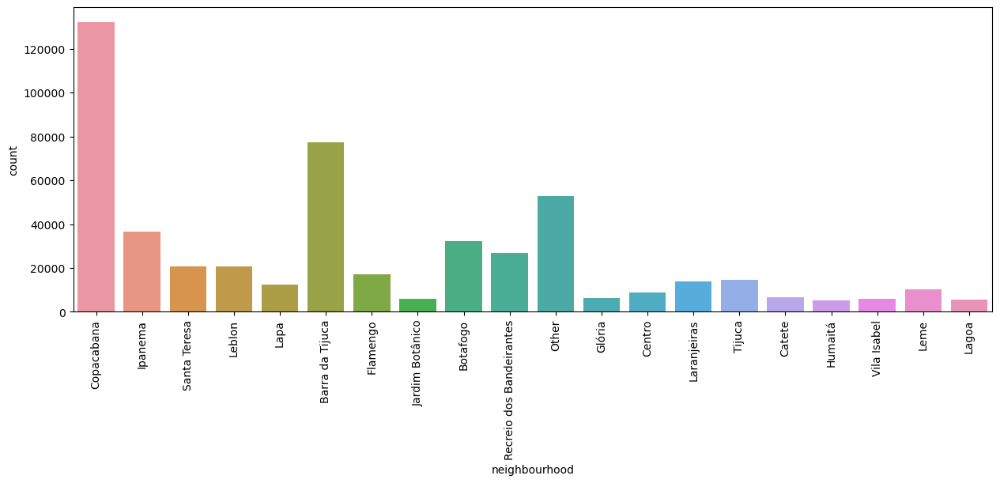

In [84]:
'''tratam-se de muitos locais, sendo a maioria com poucas informações, porém como bairro é importante,
opta-se por agrupar tudo abaixo de 5k linhas como outros para testar

optei por deletar a coluna para simplificar o modelo
'''

tabelas_bairro = df_base["neighbourhood"].value_counts()

colunas_agrupar = []

# pegar colunas para agrupar
for tipo in tabelas_bairro.index:
    if tabelas_bairro[tipo] < 5000:
        colunas_agrupar.append(tipo)
        
# alterar valores para "strict"
for tipo in colunas_agrupar:
    df_base.loc[df_base["neighbourhood"] == tipo, "neighbourhood"] = "Other"

 

print(df_base["neighbourhood"].value_counts())

# visualizar em gráfico
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x=df_base["neighbourhood"])
grafico.tick_params(axis="x", rotation=90) # para deixar a legenda em pé
plt.show()

In [224]:
# coluna amenities (lista de textos)
'''ao invés do parâmetro ser cada amenity, podemos analisar a qtd de ammenities em cada imóvel como uma forma de ver o impacto
no preço

'''
df_base["n_amenities"] = df_base["amenities"].str.split(",").apply(len) # para calcular o len em cada linha isolada, caso contrário, faria o len de toda a coluna

df_base = df_base.drop("amenities", axis=1)


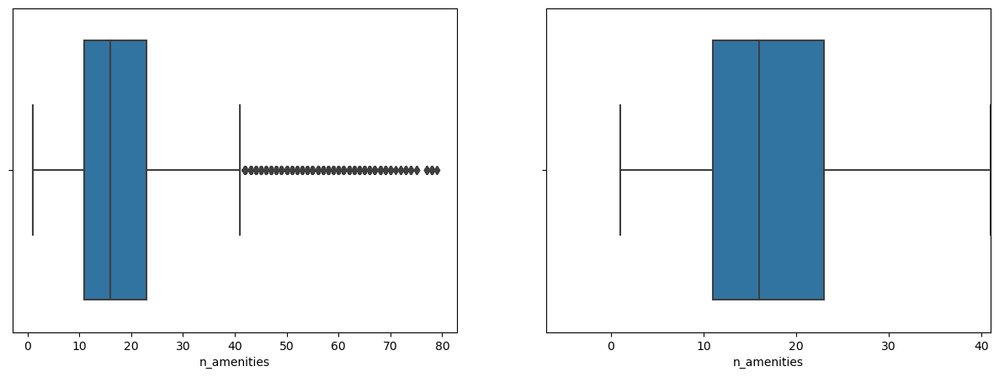

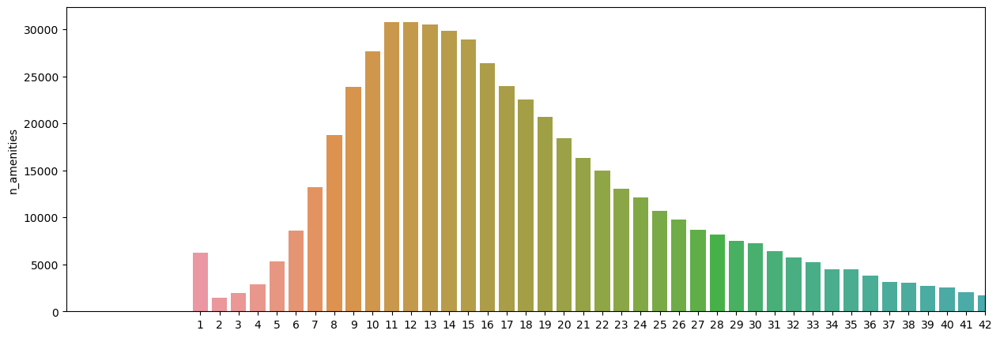

In [225]:
# excluir outliers da nova coluna de amenities

diagrama_caixa(df_base["n_amenities"])
grafico_barra(df_base["n_amenities"])

In [226]:
'''novamente, pensando no público-alvo do modelo, amenities demais não se enquadrariam
logo, opta-se pela retirada dos outliers
'''

df_base, num_linhas = excluir_outliers(df_base, "n_amenities") 

print(f"{num_linhas} linhas excluídas")


15903 linhas excluídas


In [54]:
# visualização de mapa de localização e preços -> usar biblioteca plotly (para gráficos interativos)
'''df_base.latitude == df_base["latitude"]'''

import plotly.express as px


# pegar uma amostra aleatória de dados
amostra = df_base.sample(50000)

# definir posição de centro do mapa
centro_mapa = {"lat": amostra.latitude.mean(), "lon": amostra.longitude.mean()}

# plotar gráfico (radius: tamanho bolinhas, zoom: zoom inicial)
grafico = px.density_mapbox(amostra, lat="latitude", lon="longitude", z="price", radius=2.5,
                           center=centro_mapa, zoom=10,
                           mapbox_style="stamen-terrain")

grafico.show()

### Encoding

In [ ]:
'''
analisar e ajustar as features para facilitar o trabalho do modelo futuro (features de categoria, true e false)

transformar features de T/F -> oq for verdadeiro = 1 e o que for false = 0

para categorias: a primeira opção seria numerar cada categoria (1, 2, 3, ...), porém o modelo pode criar relações numéricas entre elas que na realidade não existem
-> melhor saída é criar dummies e one hot encoding -> transformar categorias em colunas com 0's e 1's (já tem método para isso no pandas)
'''



In [228]:
# pegar colunas T/F e transformar em zeros e uns

colunas_tf = ["host_is_superhost", "instant_bookable", "is_business_travel_ready"]

df_base_enc = df_base.copy() # se não fizer assim, as alterações em uma viras as da outra

for coluna in colunas_tf:
    df_base_enc.loc[df_base_enc[coluna] == "t", coluna] = 1
    df_base_enc.loc[df_base_enc[coluna] == "f", coluna] = 0


display(df_base_enc[colunas_tf])

,host_is_superhost,instant_bookable,is_business_travel_ready
1,1,1,0
3,0,0,0
4,1,1,0
5,1,0,0
6,1,1,0
...,...,...,...
902204,0,0,0
902205,0,0,0
902206,0,0,0
902208,0,0,0


In [229]:
# tratar categorias com dummies

# pensando em diminuir o modelo, optei por deletar a coluna dos bairros (já tem colunas de lat e lon)
#df_base_enc = df_base_enc.drop("neighbourhood", axis=1)

colunas_categoria = ["property_type", "room_type", "bed_type", "cancellation_policy"]

# inserir dummies
df_base_enc = pd.get_dummies(data=df_base_enc, columns=colunas_categoria)

display(df_base_enc)

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,extra_people,...,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,bed_type_Other,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period
1,1,2.0,-22.965919,-43.178962,5,1.0,2.0,2.0,270.0,51.0,...,1,0,0,0,0,1,0,0,1,0
3,0,3.0,-22.977117,-43.190454,3,1.0,1.0,2.0,161.0,45.0,...,1,0,0,0,0,1,0,0,1,0
4,1,1.0,-22.983024,-43.214270,3,1.0,1.0,2.0,222.0,68.0,...,1,0,0,0,0,1,0,0,1,0
5,1,1.0,-22.988165,-43.193588,3,1.5,1.0,2.0,308.0,86.0,...,1,0,0,0,0,1,0,0,1,0
6,1,1.0,-22.981269,-43.190457,2,1.0,1.0,2.0,219.0,80.0,...,1,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902204,0,1.0,-22.986030,-43.191660,4,2.0,2.0,3.0,250.0,0.0,...,1,0,0,0,0,1,1,0,0,0
902205,0,0.0,-23.003180,-43.342840,4,1.0,0.0,2.0,121.0,50.0,...,1,0,0,0,0,1,1,0,0,0
902206,0,0.0,-22.966640,-43.393450,4,2.0,2.0,3.0,799.0,0.0,...,1,0,0,0,0,1,1,0,0,0
902208,0,0.0,-23.003400,-43.341820,4,1.0,1.0,1.0,250.0,0.0,...,1,0,0,0,0,1,0,0,0,1


### Modelo de Previsão

In [61]:
'''
vamos utilizar machine learning para o nosso modelo de previsão:

Passos:
1. Definir se é classificação ou regressão
2. Escolher as métricas para avaliar o modelo
3. Escolher quais modelos vamos usar/testar
4. Treinar os modelos e testar
5. Comparar os resultados dos modelos e escolher o vencedor
6. Analisar o melhor modelo mais a fundo
7. fazer ajustes no melhor modelo


1. Classificação (categoria) -> separar entre A, B e C
    ex: Diagnóstico, spam
    
regressão (valor específico) -> um número
    ex: preço, velocidade
    
a regressão mais simples é Y = a*X + b (vamos utilizar 3 modelos distintos)







2. como definir o melhor modelo? é o que erra menos? é o que acerta mais?

vamos usar duas métricas: r² e erro quadrático médio

r² -> de 0 a 1 (quanto maior, melhor)

mede o "quanto" de valores o modelo consegue explicar

RSME (erro quadrático médio ou raiz do erro quadrático médio) -> pode ser qualquer valor, mede o quanto o modelo erra (quanto maior, pior)
cálculo: raiz do (somatório de todos (valor_real-valor_modelo²))




para modelos de classificação:

use os modelos de RandomForestClassifier e ExtraTreesClassifier.
Aqui estão a documentação deles com alguns exemplos de como usar:
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesClassifier.html
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

Geralmente as métricas pra esse tipo de modelo são precisão, recall, f1 e matriz de confusão:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

Todos eles você pode acessar a documentação pelo site oficial do scikitlearn:
https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics




3. quais modelos vamos usar

Regressão linear -> traçar a melhor reta que minimize os erros (bem rápido, mas nem sempre tão certeiro)

Random forest -> pega todos os dados, gera várias árvores com pedaços menores dos dados e traça uma média entre todas as árvores (escolhe a melhor pergunta)

Extra trees -> bem parecido com o random forest, mas escolhe uma pergunta aleatória




4. treinar e testar o modelo

separar aleatoriamente os dados em 2 conjuntos: treino e teste

pelo treino, o modelo vai aprender, e pelo teste, vamos ver se ele aprendeu bem (não se deve fornecer todos dados como treino para não correr o risco de gerar overfitting -> ele pode ficar muito bom para os dados fornecidos, mas ruim para dados reais (generalização))




5. calcular o r² e o RSME e escolher um como o principal (o outro será usado como critério de desempate)

levar em consideração que modelos mais rápidos são melhores, assim como modelos que utilizam menos informações (quanto mais simples, melhor)




6. como esse modelo funciona? quais as features mais importantes?

identificar a importância de cada feature para ver oportunidades de melhoria (se coluna não for tão utilizada ou pouco relevante, pode-se retirá-la)
- foco na melhoria das métricas, simplificação do modelo e aumento de velocidade




7. fazer os devidos ajustes


vemos se as features utilizadas podem ser retiradas e a cada vez, ir comparando com os resultados originais (fazer uma mudança de cada vez)
testar hipóteses (se vale a pena excluir colunas ou tratar outliers, por exemplo)
'''



,host_is_superhost,host_listings_count,neighbourhood,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,...,guests_included,extra_people,minimum_nights,number_of_reviews,instant_bookable,is_business_travel_ready,cancellation_policy,Mês,Ano,n_amenities
1,0,2.0,Copacabana,-22.965919,-43.178962,Condominium,Entire home/apt,5,1.0,2.0,...,2,270.0,4,205,1,0,strict,4,2018,25
2,0,1.0,Ipanema,-22.985698,-43.201935,Apartment,Entire home/apt,2,1.0,1.0,...,2,222.0,3,85,0,0,strict,4,2018,20
3,0,3.0,Copacabana,-22.977117,-43.190454,Apartment,Entire home/apt,3,1.0,1.0,...,2,161.0,4,208,0,0,strict,4,2018,14
4,0,1.0,Ipanema,-22.983024,-43.214270,Apartment,Entire home/apt,3,1.0,1.0,...,2,222.0,2,200,1,0,strict,4,2018,16
5,0,1.0,Ipanema,-22.988165,-43.193588,Apartment,Entire home/apt,3,1.5,1.0,...,2,308.0,2,116,0,0,strict,4,2018,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902204,f,1.0,Copacabana,-22.986030,-43.191660,Apartment,Entire home/apt,4,2.0,2.0,...,1,250.0,1,0,f,f,flexible,9,2019,15
902205,f,0.0,Barra da Tijuca,-23.003180,-43.342840,Apartment,Entire home/apt,4,1.0,0.0,...,2,121.0,1,0,f,f,flexible,9,2019,18
902206,f,0.0,Barra da Tijuca,-22.966640,-43.393450,Apartment,Entire home/apt,4,2.0,2.0,...,1,799.0,2,0,f,f,flexible,9,2019,12
902208,f,0.0,Barra da Tijuca,-23.003400,-43.341820,Apartment,Entire home/apt,4,1.0,1.0,...,1,250.0,1,0,f,f,strict_14_with_grace_period,9,2019,25


In [230]:
'''normalmente os melhores modelos de regressão são aqueles que vão errar menos

vamos usar o r² e RSME -> importar do sklearn

'''
# definir função para avaliar métricas de avaliação

from sklearn.metrics import r2_score, mean_squared_error


def avaliar_modelo(nome_modelo, y_teste, previsao):
    r2 = r2_score(y_teste, previsao)
    rsme = np.sqrt(mean_squared_error(y_teste, previsao))
    
    return f"Modelo: {nome_modelo}\nr²: {r2:.2%}\nRSME: {rsme:.2f}"

In [231]:
# escolha dos modelos a serem testados

from sklearn.linear_model import LinearRegression # importar modelo de regressão linear
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor # importar modelos de random forest e de extra trees


rf = RandomForestRegressor()
lr = LinearRegression()
et = ExtraTreesRegressor()

modelos = {"RandomForest": rf,
          "LinearRegression": lr,
          "ExtraTrees": et}

# definir X e Y para o modelo
y = df_base_enc["price"]
x = df_base_enc.drop("price", axis=1)


In [232]:
# separar dados em treino e teste e treinar o modelo (biblioteca graphviz mostra graficamente a tomada de decisão)

from sklearn.model_selection import train_test_split


x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=1) # definir o random_state (pode ser qualquer número) é sempre fazer o pc usar os mesmos dados aleatórios e não dar resultados diferentes a cada hora


for nome_modelo, modelo in modelos.items():
    
    # treinar
    modelo.fit(x_train, y_train)
    
    # testar
    previsao = modelo.predict(x_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo: RandomForest
r²: 96.77%
RSME: 47.52
Modelo: LinearRegression
r²: 33.27%
RSME: 216.16
Modelo: ExtraTrees
r²: 97.28%
RSME: 43.62


### Análise do Melhor Modelo

In [ ]:
# modelo de extra trees se mostrou como o mais assertivo e foi escolhido como o melhor para essa situação

'''
variáveis a serem consideradas: r², rsme e velocidade

regressão linear não se mostrou como um modelo eficaz
'''



### Ajustes e Melhorias no Melhor Modelo

[0.01240437 0.0365102  0.09096587 0.08497729 0.07316175 0.0730617
 0.11696463 0.04729841 0.08489462 0.06406123 0.06756416 0.02137562
 0.         0.00431835 0.01074233 0.07214972 0.01165883 0.00134437
 0.00515795 0.00071568 0.00100337 0.00065687 0.00682985 0.0022392
 0.00219121 0.00236694 0.05401873 0.00032806 0.00397088 0.00166029
 0.00224427 0.00221358 0.01930284 0.01221102 0.00090286 0.00853296]
Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'extra_people',
       'minimum_nights', 'number_of_reviews', 'instant_bookable',
       'is_business_travel_ready', 'Mês', 'Ano', 'n_amenities',
       'property_type_Apartment', 'property_type_Bed and breakfast',
       'property_type_Condominium', 'property_type_Guest suite',
       'property_type_Guesthouse', 'property_type_Hostel',
       'property_type_House', 'property_type_Loft', 'property_type_Other',
       'property_type_Serviced apartment', 'room_type

,0
bedrooms,0.116965
latitude,0.090966
longitude,0.084977
extra_people,0.084895
accommodates,0.073162
bathrooms,0.073062
n_amenities,0.072150
number_of_reviews,0.067564
minimum_nights,0.064061
room_type_Entire home/apt,0.054019


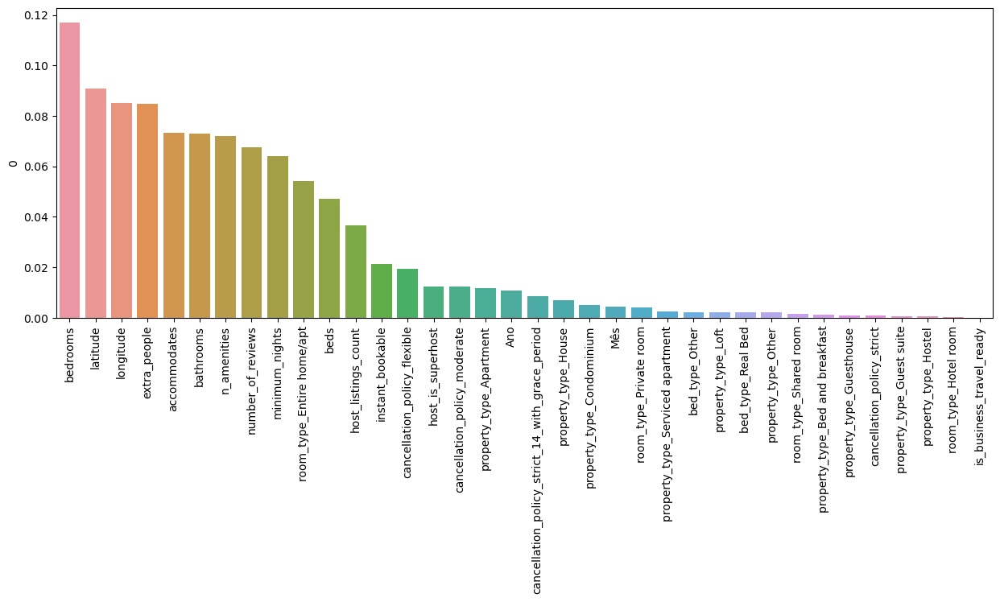

In [234]:
'''
ajustes podem melhorar tanto nos indicadores quanto na simplicidade e velocidade do código

lr.coef_ -> para coeficientes da LinearRegression
'''

# entender features e ordens de prioridade usadas pelo modelo
print(et.feature_importances_) # printa uma lista de números das colunas na mesma ordem em que foi passado o x_train
print(x_train.columns)


# juntar listas em df -> pd.DataFrame(dados, indíces)
importancia_features = pd.DataFrame(et.feature_importances_, x_train.columns)


# ordenar em ordem decrescente
importancia_features = importancia_features.sort_values(0, ascending=False)

# mostrar tabela
display(importancia_features)

# exibir em formato de gráfico
plt.figure(figsize=(15, 5))
ax = sns.barplot(x=importancia_features.index, y=importancia_features[0])
ax.tick_params(axis="x", rotation=90)
plt.show()

Modelo: ExtraTrees
r²: 97.07%
RSME: 45.35


,Previsão,Resposta
0,349.99,349.0
1,191.22,189.0
2,735.62,1199.0
3,170.80,174.0
4,649.11,649.0
...,...,...
157457,117.27,117.0
157458,58.69,49.0
157459,101.00,100.0
157460,151.96,155.0


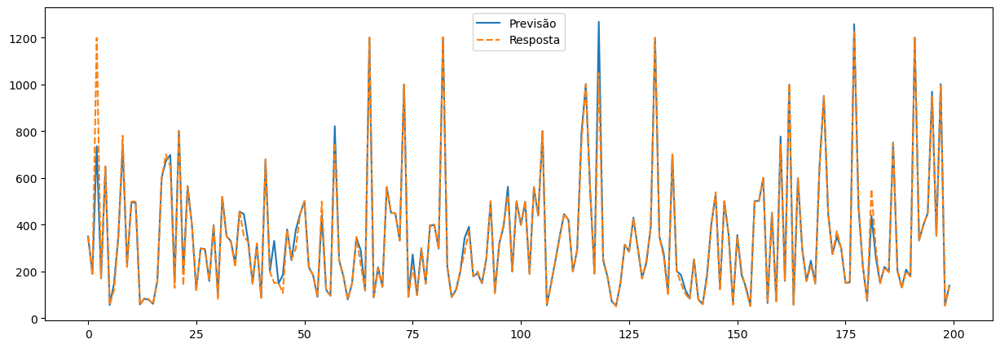

In [237]:
''' testar retirada do is_business_travel_ready para ver se melhora o modelo
(fazer uma alteração por vez e cuidar com colunas dummies -> não pode retirar só uma, já que ela faz parte de toda uma lógica)
'''

base_teste = df_base_enc.copy()
base_teste = base_teste.drop("is_business_travel_ready", axis=1) # retirar is_business_travel_ready

# definir X e Y para o modelo
y = base_teste["price"]
x = base_teste.drop("price", axis=1)

x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=1, test_size=0.3) # definir o random_state (pode ser qualquer número -> será usado de seed) é sempre fazer o pc usar os mesmos dados aleatórios e não dar resultados diferentes a cada hora

# treinar
et.fit(x_train, y_train)
    
# testar
previsao = et.predict(x_test)
print(avaliar_modelo("ExtraTrees", y_test, previsao))

comp = pd.DataFrame({"Previsão": previsao, "Resposta": list(y_test)})

display(comp)

plt.figure(figsize=(15, 5))
sns.lineplot(data=comp[:200])
plt.show()

In [ ]:
'''
tirar is_business_travel_ready piorou infimamente o modelo, mas o simplificou com a retirada de uma coluna.
Logo, vou optar por retirá-la mesmo
'''

Modelo: ExtraTrees
r²: 97.07%
RSME: 45.33


,Previsão,Resposta
0,350.00,349.0
1,191.15,189.0
2,737.70,1199.0
3,169.33,174.0
4,649.13,649.0
...,...,...
157457,118.44,117.0
157458,57.33,49.0
157459,101.48,100.0
157460,153.73,155.0


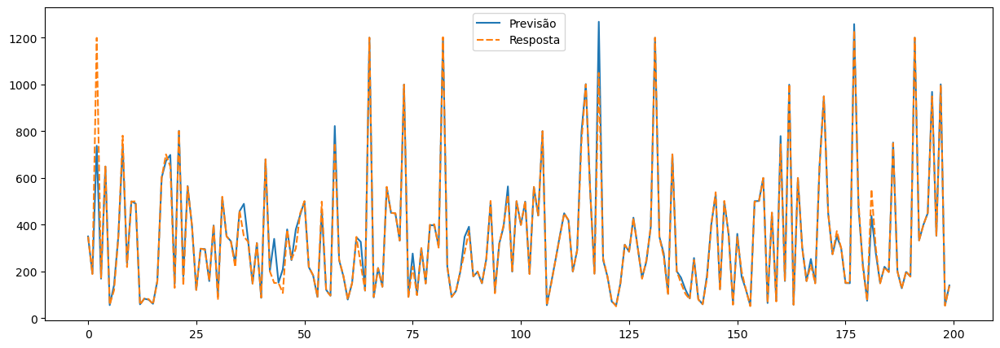

In [239]:
'''
testar retirada de bed_type

mesmo tirando colunas que representem algo, o modelo ainda pode melhorar, considerando que o modelo com muitas variáveis começa a 
fazer sobre ajustes, ficando muito específico para os dados que foram dados
'''

teste = base_teste.copy()

for coluna in teste:
    if "bed_type" in coluna:
        teste = teste.drop(coluna, axis=1)

# definir X e Y para o modelo
y = teste["price"]
x = teste.drop("price", axis=1)

x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=1, test_size=0.3) # definir o random_state (pode ser qualquer número -> será usado de seed) é sempre fazer o pc usar os mesmos dados aleatórios e não dar resultados diferentes a cada hora

# treinar
et.fit(x_train, y_train)
    
# testar
previsao = et.predict(x_test)
print(avaliar_modelo("ExtraTrees", y_test, previsao))

comp = pd.DataFrame({"Previsão": previsao, "Resposta": list(y_test)})

display(comp)

plt.figure(figsize=(15, 5))
sns.lineplot(data=comp[:200])
plt.show()

In [ ]:
'''
com poucas variações nos indicadores, porém mais simplificado, opta-se por manter o modelo sem bed_type também
'''

In [ ]:
# deploy do código
- Passo 1 -> Criar arquivo do Modelo (joblib)<br>
- Passo 2 -> Escolher a forma de deploy:
    - Arquivo Executável + Tkinter
    - Deploy em Microsite (Flask)
    - Deploy apenas para uso direto Streamlit (é o que vamos usar)
- Passo 3 -> criar Outro arquivo Python (pode ser Jupyter ou PyCharm)
- Passo 4 -> Importar streamlit e criar código
- Passo 5 -> Atribuir ao botão o carregamento do modelo
- Passo 6 -> Deploy feito



In [240]:
# salvar base tratada em arquivo csv

x["price"] = y

x.to_csv("dados.csv", index=False)

In [241]:
# exportar o nosso modelo

import joblib


# pega um objeto python e transforma ele em um arquivo -> .dump(variável, nome_do_arquivo.joblib)
joblib.dump(et, "modelo.joblib")

['modelo.joblib']

In [ ]:
'''
em seguida, criar outro arquivo python neste arquivo
'''